### Importación de datos



In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import numpy as np
import urllib.error
from IPython.display import display


url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [48]:
# Función para dar formato estilo moneda al resultado
def format_currency(amount):
    return '${:,.2f}'.format(amount)

# Calcular el total de ventas (Precio) para cada tienda
total_tienda1 = tienda['Precio'].sum()
total_tienda2 = tienda2['Precio'].sum()
total_tienda3 = tienda3['Precio'].sum()
total_tienda4 = tienda4['Precio'].sum()




Total de ventas Tienda 1: $1,150,880,400.00
Total de ventas Tienda 2: $1,116,343,500.00
Total de ventas Tienda 3: $1,098,019,600.00
Total de ventas Tienda 4: $1,038,375,700.00


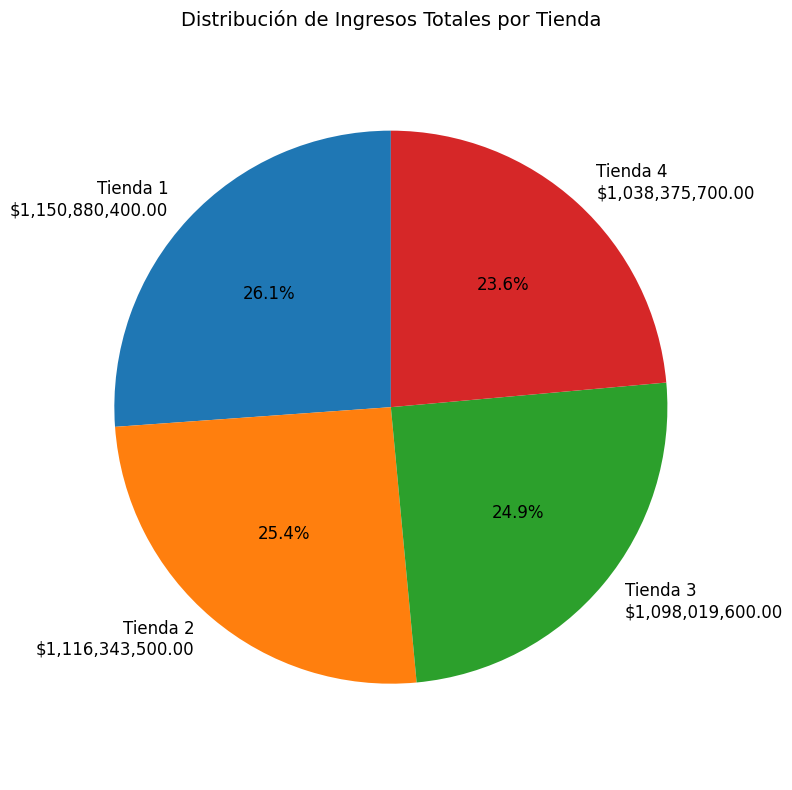

In [49]:
# Imprimir los resultados
print(f"Total de ventas Tienda 1: {format_currency(total_tienda1)}")
print(f"Total de ventas Tienda 2: {format_currency(total_tienda2)}")
print(f"Total de ventas Tienda 3: {format_currency(total_tienda3)}")
print(f"Total de ventas Tienda 4: {format_currency(total_tienda4)}")

# Preparar datos para el gráfico de pastel
totales = [total_tienda1, total_tienda2, total_tienda3, total_tienda4]
nombres_tiendas = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']
colores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Azul, naranja, verde, rojo

# Verificar que haya datos válidos
if sum(totales) <= 0:
    print("Error: No hay datos válidos para generar el gráfico de pastel.")
else:
    # Crear el gráfico de pastel
    plt.figure(figsize=(8, 8))
    # Generar el gráfico con etiquetas que incluyan el nombre, porcentaje y valor en moneda
    labels = [f"{nombre}\n{format_currency(total)}" for nombre, total in zip(nombres_tiendas, totales)]
    plt.pie(totales, labels=labels, colors=colores, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 12})
    plt.title('Distribución de Ingresos Totales por Tienda', fontsize=14)
    # Hacer que el gráfico sea circular
    plt.axis('equal')
    # Ajustar el diseño
    plt.savefig(f'distribucion_ingresos_por_tienda.png')
    plt.tight_layout()

# 2. Ventas por categoría


Tienda 1 - Ventas por Categoría:
    Categoría del Producto  Cantidad Vendida
0                  Muebles               465
1             Electrónicos               448
2                 Juguetes               324
3        Electrodomésticos               312
4     Deportes y diversión               284
5   Instrumentos musicales               182
6                   Libros               173
7  Artículos para el hogar               171
Categoría con más ventas en Tienda 1: Muebles (465 ventas)

Tienda 2 - Ventas por Categoría:
    Categoría del Producto  Cantidad Vendida
0                  Muebles               442
1             Electrónicos               422
2                 Juguetes               313
3        Electrodomésticos               305
4     Deportes y diversión               275
5   Instrumentos musicales               224
6                   Libros               197
7  Artículos para el hogar               181
Categoría con más ventas en Tienda 2: Muebles (442 ventas)

Tie

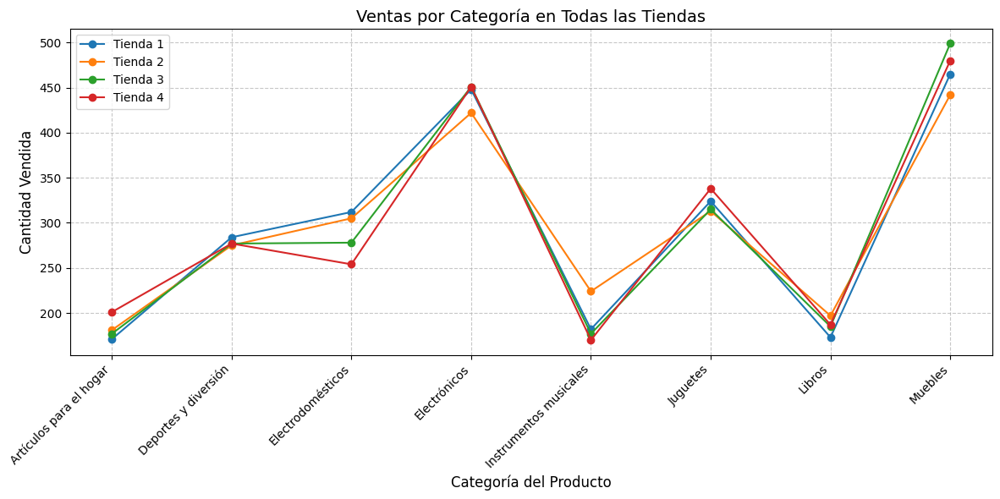

In [50]:
# Lista de tiendas con sus datos y nombres
tiendas = [
    (tienda, "Tienda 1"),
    (tienda2, "Tienda 2"),
    (tienda3, "Tienda 3"),
    (tienda4, "Tienda 4")
]

# Lista para almacenar los datos de ventas por categoría de todas las tiendas
ventas_todas_tiendas = []
categorias_unicas = set()

# Procesar cada tienda
for df, nombre_tienda in tiendas:
    # Agrupar por Categoría del Producto y contar las ventas
    ventas_por_categoria = df.groupby('Categoría del Producto').size().reset_index(name='Cantidad Vendida')

    # Ordenar por cantidad vendida de mayor a menor
    ventas_por_categoria = ventas_por_categoria.sort_values(by='Cantidad Vendida', ascending=False)

    # Restablecer el índice para que sea consecutivo
    ventas_por_categoria = ventas_por_categoria.reset_index(drop=True)

    # Mostrar resultados
    print(f"\n{nombre_tienda} - Ventas por Categoría:")
    print(ventas_por_categoria)

    # Imprimir la categoría con más ventas
    if not ventas_por_categoria.empty:
        categoria_mas_vendida = ventas_por_categoria.iloc[0]['Categoría del Producto']
        cantidad_mas_vendida = ventas_por_categoria.iloc[0]['Cantidad Vendida']
        print(f"Categoría con más ventas en {nombre_tienda}: {categoria_mas_vendida} ({cantidad_mas_vendida} ventas)")
    else:
        print(f"No hay datos de ventas para {nombre_tienda}")

    # Agregar datos a la lista para el gráfico
    ventas_todas_tiendas.append((nombre_tienda, ventas_por_categoria))

    # Actualizar el conjunto de categorías únicas
    categorias_unicas.update(ventas_por_categoria['Categoría del Producto'])

# Convertir categorías únicas a una lista ordenada
categorias_unicas = sorted(categorias_unicas)

# Preparar datos para el gráfico de líneas
plt.figure(figsize=(12, 6))
colores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Azul, naranja, verde, rojo

# Graficar una línea por tienda
for (nombre_tienda, ventas_por_categoria), color in zip(ventas_todas_tiendas, colores):
    # Crear un diccionario para mapear categorías a cantidades vendidas
    ventas_dict = dict(zip(ventas_por_categoria['Categoría del Producto'], ventas_por_categoria['Cantidad Vendida']))

    # Crear lista de cantidades vendidas, rellenando con 0 para categorías no presentes
    cantidades = [ventas_dict.get(categoria, 0) for categoria in categorias_unicas]

    # Graficar la línea
    plt.plot(categorias_unicas, cantidades, marker='o', label=nombre_tienda, color=color)

# Configurar el gráfico
plt.title('Ventas por Categoría en Todas las Tiendas', fontsize=14)
plt.xlabel('Categoría del Producto', fontsize=12)
plt.ylabel('Cantidad Vendida', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig(f'ventas_por_categoria.png')
plt.tight_layout()


# 3. Calificación promedio de la tienda


In [51]:
# Lista para almacenar las calificaciones promedio por tienda (para el gráfico)
calificaciones_promedio = []
nombres_tiendas = []

# Procesar cada tienda
for df, nombre_tienda in tiendas:
    # Calcular la calificación promedio
    calificacion_promedio = df['Calificación'].mean()

    # Almacenar para el gráfico
    calificaciones_promedio.append(float(calificacion_promedio))
    nombres_tiendas.append(nombre_tienda)

    # Mostrar la calificación promedio
    print(f"Calificación promedio en {nombre_tienda}: {calificacion_promedio:.2f}")



Calificación promedio en Tienda 1: 3.98
Calificación promedio en Tienda 2: 4.04
Calificación promedio en Tienda 3: 4.05
Calificación promedio en Tienda 4: 4.00


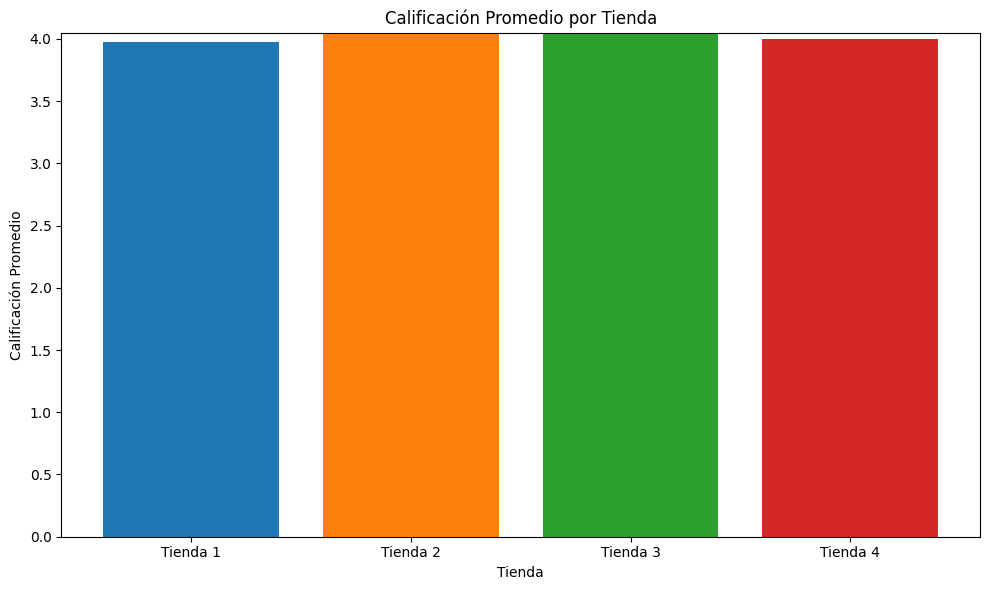

In [52]:
# Lista de colores para cada barra (una por tienda)
colores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Azul, naranja, verde, rojo

#Visualización de calificaciones promedio
plt.figure(figsize=(10, 6))
plt.bar(nombres_tiendas, calificaciones_promedio, color=colores)
plt.title('Calificación Promedio por Tienda')
plt.xlabel('Tienda')
plt.ylabel('Calificación Promedio')

# Ajustar el eje Y dinámicamente según los valores
if calificaciones_promedio and max(calificaciones_promedio) > 0:
    plt.ylim(0, max(calificaciones_promedio) * 1)
else:
    plt.ylim(0, 5)  # Valor por defecto si no hay datos válidos
plt.savefig(f'calificacion_promedio_por_tienda.png')
plt.tight_layout()


# 4. Productos más y menos vendidos


Tienda 1 - Ventas por Producto:
                       Producto  Cantidad Vendida
0                       Armario                60
1                 TV LED UHD 4K                60
2                    Microondas                60
3              Secadora de ropa                58
4                 Mesa de noche                56
5       Bloques de construcción                56
6           Balón de baloncesto                55
7                     Bicicleta                54
8                     Impresora                54
9                  Vaso térmico                54
10                 Refrigerador                54
11                      Batería                53
12                   Cubertería                52
13    Carrito de control remoto                52
14          Modelado predictivo                51
15                  Auriculares                50
16            Ajedrez de madera                49
17                    Iphone 15                49
18               

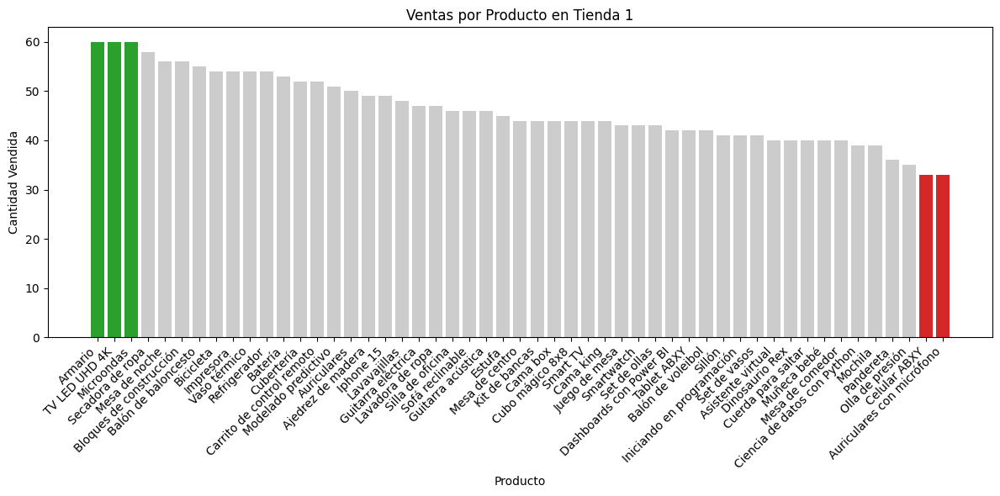

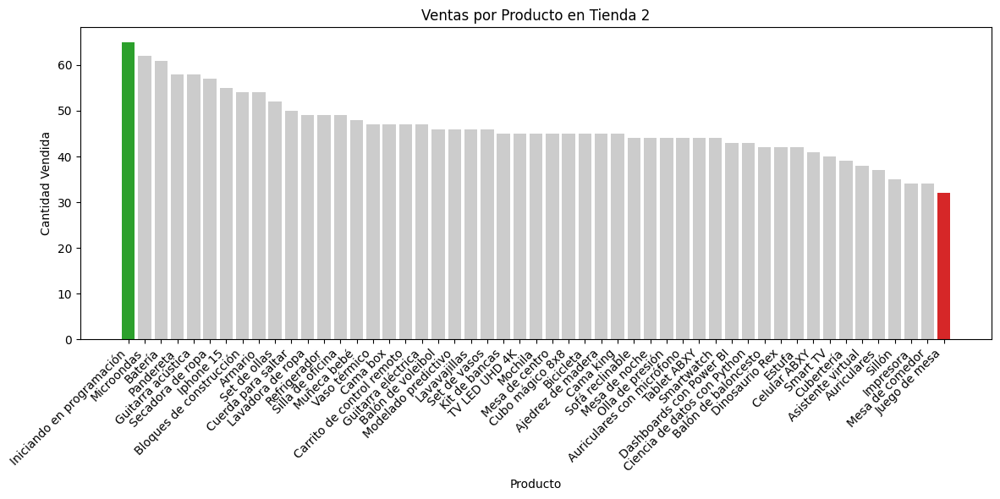

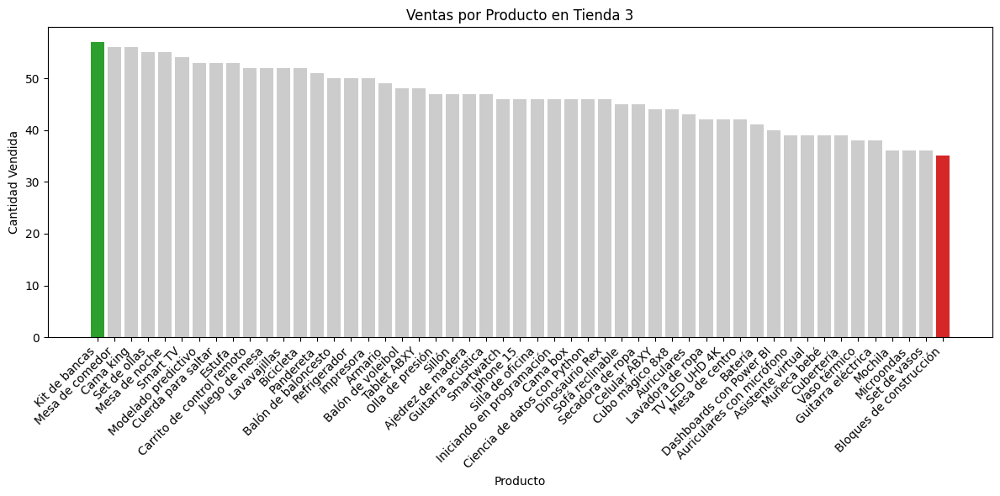

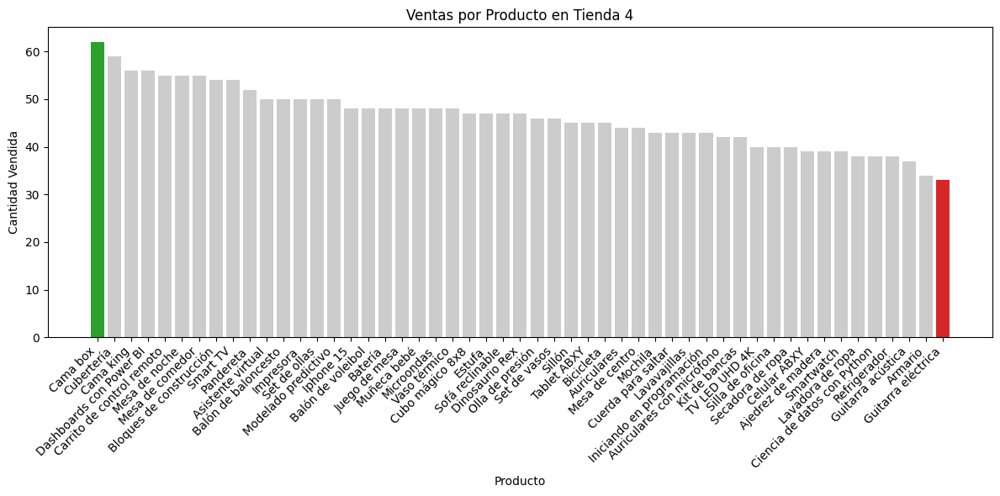

In [53]:
# Procesar cada tienda
for df, nombre_tienda in tiendas:
    # Agrupar por Producto y contar las ventas
    ventas_por_producto = df.groupby('Producto').size().reset_index(name='Cantidad Vendida')

    # Ordenar por cantidad vendida de mayor a menor
    ventas_por_producto = ventas_por_producto.sort_values(by='Cantidad Vendida', ascending=False)

    # Restablecer el índice para que sea consecutivo
    ventas_por_producto = ventas_por_producto.reset_index(drop=True)

    # Verificar si hay datos
    if ventas_por_producto.empty:
        print(f"\n{nombre_tienda} - No hay datos de ventas disponibles.")
        continue

    # Identificar el producto más vendido
    max_ventas = ventas_por_producto['Cantidad Vendida'].max()
    productos_mas_vendidos = ventas_por_producto[ventas_por_producto['Cantidad Vendida'] == max_ventas]['Producto'].tolist()

    # Identificar el producto menos vendido
    min_ventas = ventas_por_producto['Cantidad Vendida'].min()
    productos_menos_vendidos = ventas_por_producto[ventas_por_producto['Cantidad Vendida'] == min_ventas]['Producto'].tolist()

    # Mostrar resultados
    print(f"\n{nombre_tienda} - Ventas por Producto:")
    print(ventas_por_producto)
    print(f"Producto(s) más vendido(s): {', '.join(productos_mas_vendidos)} ({max_ventas} ventas)")
    print(f"Producto(s) menos vendido(s): {', '.join(productos_menos_vendidos)} ({min_ventas} ventas)")

    # Visualización
    plt.figure(figsize=(12, 6))
    # Crear lista de colores: verde para más vendido, rojo para menos vendido, gris para otros
    colores = []
    for _, row in ventas_por_producto.iterrows():
        if row['Producto'] in productos_mas_vendidos:
            colores.append('#2ca02c')  # Verde para más vendido
        elif row['Producto'] in productos_menos_vendidos:
            colores.append('#d62728')  # Rojo para menos vendido
        else:
            colores.append('#cccccc')  # Gris para otros

    plt.bar(ventas_por_producto['Producto'], ventas_por_producto['Cantidad Vendida'], color=colores)
    plt.title(f'Ventas por Producto en {nombre_tienda}')
    plt.xlabel('Producto')
    plt.ylabel('Cantidad Vendida')
    plt.xticks(rotation=45, ha='right')
    plt.savefig(f'ventas_{nombre_tienda.replace(" ", "_").lower()}.png')
    plt.tight_layout()

# 5. Envío promedio por tienda

Costo de envío promedio en Tienda 1: $26,018.61
Costo de envío promedio en Tienda 2: $25,216.24
Costo de envío promedio en Tienda 3: $24,805.68
Costo de envío promedio en Tienda 4: $23,459.46


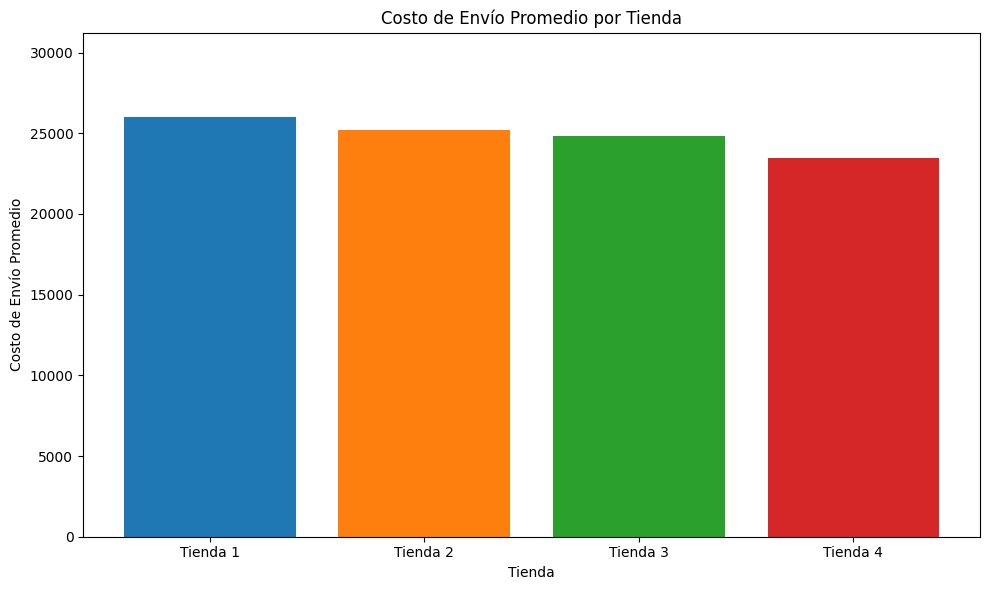

In [54]:
# Lista para almacenar los costos de envío promedio por tienda (para el gráfico)
costos_envio_promedio = []
nombres_tiendas = []

# Procesar cada tienda
for df, nombre_tienda in tiendas:
    try:
        # Verificar que la columna 'Costo de envío' existe
        if 'Costo de envío' not in df.columns:
            print(f"Error: La columna 'Costo de envío' no existe en {nombre_tienda}")
            costos_envio_promedio.append(0)
            nombres_tiendas.append(nombre_tienda)
            continue

        # Convertir la columna 'Costo de envío' a numérico, forzando errores a NaN
        df['Costo de envío'] = pd.to_numeric(df['Costo de envío'], errors='coerce')

        # Calcular el costo de envío promedio (ignorando NaN)
        costo_envio_promedio = df['Costo de envío'].mean()

        # Manejar caso de datos vacíos o todos NaN
        if pd.isna(costo_envio_promedio):
            print(f"Advertencia: No hay costos de envío válidos en {nombre_tienda}")
            costo_envio_promedio = 0

        # Almacenar para el gráfico
        costos_envio_promedio.append(costo_envio_promedio)
        nombres_tiendas.append(nombre_tienda)

        # Mostrar el costo de envío promedio
        print(f"Costo de envío promedio en {nombre_tienda}: {format_currency(costo_envio_promedio)}")

    except Exception as e:
        print(f"Error al procesar {nombre_tienda}: {e}")
        costos_envio_promedio.append(0)
        nombres_tiendas.append(nombre_tienda)

# Imprimir los valores de costos_envio_promedio para depuración
#print("\nValores de costos de envío promedio para el gráfico:", costos_envio_promedio)

# Visualización de costos de envío promedio
plt.figure(figsize=(10, 6))
# Lista de colores para cada barra (una por tienda)
colores = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Azul, naranja, verde, rojo
plt.bar(nombres_tiendas, costos_envio_promedio, color=colores)
plt.title('Costo de Envío Promedio por Tienda')
plt.xlabel('Tienda')
plt.ylabel('Costo de Envío Promedio')
# Ajustar el eje Y dinámicamente según los valores
if costos_envio_promedio and max(costos_envio_promedio) > 0:
    plt.ylim(0, max(costos_envio_promedio) * 1.2)  # Añade un 20% extra para visibilidad
else:
    plt.ylim(0, 10)  # Valor por defecto si no hay datos válidos
plt.savefig(f'costo_de_envio_promedio_por_tienda.png')
plt.tight_layout()

#6. EXTRA

In [55]:
# Colores para cada tienda (en formato HTML para Folium)
colores = ['blue', 'orange', 'green', 'red']

# Preparar datos para el mapa y análisis
ventas_por_tienda = []
total_ventas_por_tienda = []
all_coords = []

# Procesar cada tienda
for df, nombre_tienda in tiendas:
    try:
        # Verificar que las columnas 'lat' y 'lon' existen
        if 'lat' not in df.columns or 'lon' not in df.columns:
            print(f"Error: Las columnas 'lat' o 'lon' no existen en {nombre_tienda}")
            continue

        # Convertir 'lat' y 'lon' a numérico, forzando errores a NaN
        df['lat'] = pd.to_numeric(df['lat'], errors='coerce')
        df['lon'] = pd.to_numeric(df['lon'], errors='coerce')

        # Eliminar filas con valores NaN o fuera de rangos válidos
        df_geo = df[['lat', 'lon']].dropna()
        df_geo = df_geo[(df_geo['lat'].between(-90, 90)) & (df_geo['lon'].between(-180, 180))]

        # Verificar si hay datos válidos
        if df_geo.empty:
            print(f"Advertencia: No hay datos geográficos válidos en {nombre_tienda}")
            continue

        # Almacenar datos para el mapa y análisis
        ventas_por_tienda.append((nombre_tienda, df_geo))
        total_ventas_por_tienda.append((nombre_tienda, len(df_geo)))
        all_coords.extend(df_geo[['lat', 'lon']].values.tolist())

        # Mostrar número de ventas válidas
        print(f"\n{nombre_tienda} - Ventas con datos geográficos: {len(df_geo)}")

    except Exception as e:
        print(f"Error al procesar {nombre_tienda}: {e}")

# Crear mapa interactivo con Folium
if not all_coords:
    print("Error: No hay datos geográficos válidos para generar el mapa.")
else:
    # Calcular el centro del mapa (promedio de coordenadas)
    center_lat = np.mean([coord[0] for coord in all_coords])
    center_lon = np.mean([coord[1] for coord in all_coords])

    # Crear el mapa centrado en las coordenadas promedio
    mapa = folium.Map(location=[center_lat, center_lon], zoom_start=10, tiles='OpenStreetMap')

    # Añadir marcadores para cada venta
    for (nombre_tienda, df_geo), color in zip(ventas_por_tienda, colores):
        # Crear un FeatureGroup para cada tienda (permite activar/desactivar en el mapa)
        fg = folium.FeatureGroup(name=nombre_tienda)
        for _, row in df_geo.iterrows():
            folium.CircleMarker(
                location=[row['lat'], row['lon']],
                radius=5,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.6,
                popup=f"{nombre_tienda}: Venta"
            ).add_to(fg)
        fg.add_to(mapa)

    # Añadir mapa de calor para la densidad de ventas (todas las tiendas)
    heat_data = [[row['lat'], row['lon']] for _, df_geo in ventas_por_tienda for _, row in df_geo.iterrows()]
    HeatMap(heat_data, radius=15, blur=20, max_zoom=18).add_to(folium.FeatureGroup(name='Mapa de Calor').add_to(mapa))

    # Añadir control de capas
    folium.LayerControl().add_to(mapa)

    # Guardar el mapa como HTML
    mapa.save('mapa_ventas_tiendas.html')
    print("Mapa interactivo guardado como 'mapa_ventas_tiendas.html'")

    # Mostrar el mapa en la celda de Google Colab
    display(mapa)

# Análisis geográfico: Ventas por cuadrante
print("\nAnálisis Geográfico: Ventas por Cuadrante")
# Definir límites para dividir el espacio en cuadrantes
lat_min, lat_max = min([df_geo['lat'].min() for _, df_geo in ventas_por_tienda]), max([df_geo['lat'].max() for _, df_geo in ventas_por_tienda])
lon_min, lon_max = min([df_geo['lon'].min() for _, df_geo in ventas_por_tienda]), max([df_geo['lon'].max() for _, df_geo in ventas_por_tienda])
lat_mid = (lat_min + lat_max) / 2
lon_mid = (lon_min + lon_max) / 2

# Definir cuadrantes
cuadrantes = {
    'Noroeste': (lambda lat, lon: lat > lat_mid and lon < lon_mid, 'lat > lat_mid and lon < lon_mid'),
    'Noreste': (lambda lat, lon: lat > lat_mid and lon >= lon_mid, 'lat > lat_mid and lon >= lon_mid'),
    'Suroeste': (lambda lat, lon: lat <= lat_mid and lon < lon_mid, 'lat <= lat_mid and lon < lon_mid'),
    'Sureste': (lambda lat, lon: lat <= lat_mid and lon >= lon_mid, 'lat <= lat_mid and lon >= lon_mid')
}

# Calcular ventas por cuadrante
ventas_por_cuadrante = {cuadrante: [] for cuadrante in cuadrantes}
for nombre_tienda, df_geo in ventas_por_tienda:
    for cuadrante, (condicion, _) in cuadrantes.items():
        ventas_cuadrante = len(df_geo[df_geo.apply(lambda row: condicion(row['lat'], row['lon']), axis=1)])
        ventas_por_cuadrante[cuadrante].append((nombre_tienda, ventas_cuadrante))

# Imprimir análisis
total_ventas = sum(count for _, count in total_ventas_por_tienda)
for cuadrante, ventas in ventas_por_cuadrante.items():
    print(f"\nCuadrante {cuadrante}:")
    for nombre_tienda, count in ventas:
        porcentaje = (count / total_ventas * 100) if total_ventas > 0 else 0
        expected_porcentaje = next(count for n, count in total_ventas_por_tienda if n == nombre_tienda) / total_ventas * 100 if total_ventas > 0 else 0
        print(f"  {nombre_tienda}: {count} ventas ({porcentaje:.1f}%), esperado: {expected_porcentaje:.1f}%")


Tienda 1 - Ventas con datos geográficos: 2359

Tienda 2 - Ventas con datos geográficos: 2359

Tienda 3 - Ventas con datos geográficos: 2359

Tienda 4 - Ventas con datos geográficos: 2358
Mapa interactivo guardado como 'mapa_ventas_tiendas.html'



Análisis Geográfico: Ventas por Cuadrante

Cuadrante Noroeste:
  Tienda 1: 1959 ventas (20.8%), esperado: 25.0%
  Tienda 2: 2011 ventas (21.3%), esperado: 25.0%
  Tienda 3: 1996 ventas (21.2%), esperado: 25.0%
  Tienda 4: 1986 ventas (21.0%), esperado: 25.0%

Cuadrante Noreste:
  Tienda 1: 56 ventas (0.6%), esperado: 25.0%
  Tienda 2: 61 ventas (0.6%), esperado: 25.0%
  Tienda 3: 48 ventas (0.5%), esperado: 25.0%
  Tienda 4: 35 ventas (0.4%), esperado: 25.0%

Cuadrante Suroeste:
  Tienda 1: 312 ventas (3.3%), esperado: 25.0%
  Tienda 2: 253 ventas (2.7%), esperado: 25.0%
  Tienda 3: 274 ventas (2.9%), esperado: 25.0%
  Tienda 4: 302 ventas (3.2%), esperado: 25.0%

Cuadrante Sureste:
  Tienda 1: 32 ventas (0.3%), esperado: 25.0%
  Tienda 2: 34 ventas (0.4%), esperado: 25.0%
  Tienda 3: 41 ventas (0.4%), esperado: 25.0%
  Tienda 4: 35 ventas (0.4%), esperado: 25.0%


In [ ]:
!ls /content/


calificacion_promedio_por_tienda.png	ventas_por_categoria.png
costo_de_envio_promedio_por_tienda.png	ventas_tienda_1.png
dist.png				ventas_tienda_2.png
mapa_ventas_tiendas.html		ventas_tienda_3.png
sample_data				ventas_tienda_4.png


# Informe Final: Análisis de Ventas de Tiendas

## 1. Introducción

Este informe presenta un análisis exhaustivo de las ventas, ingresos, calificaciones, costos de envío y distribución geográfica de cuatro tiendas. El objetivo es evaluar el rendimiento de cada tienda, identificar patrones que influyen en los resultados y proporcionar recomendaciones estratégicas, incluyendo la posible venta de una tienda. Se utilizan gráficos de pastel, líneas, barras y un mapa interactivo para visualizar los resultados, complementados con un análisis cuantitativo de las ventas por cuadrante geográfico.

**Resumen**: La Tienda 4 tiene el menor rendimiento en ingresos y presencia geográfica, por lo que se recomienda su venta.

## 2. Análisis de Ingresos

El siguiente gráfico de pastel muestra la distribución de los ingresos totales por tienda:

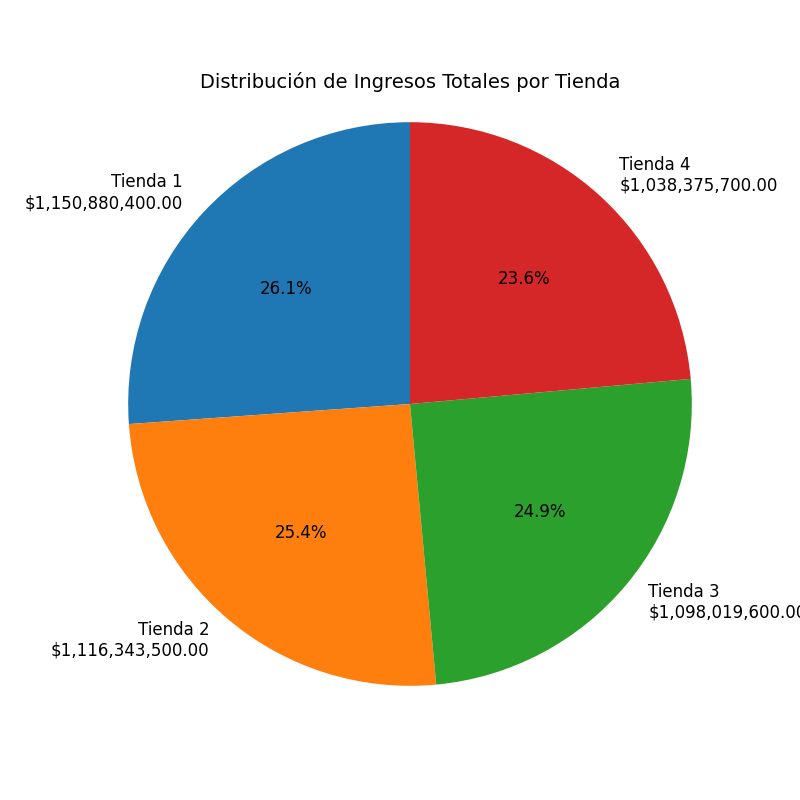

**Resultados**:

- **Tienda 1**: $1,150,880,400.00 (26.5% del total), lidera en ingresos, probablemente debido a productos de alto valor (por ejemplo, Armario, TV LED UHD 4K).
- **Tienda 2**: $1,116,343,500.00 (25.7%), muestra un desempeño sólido, impulsado por productos como *Iniciando en programación* (65 ventas).
- **Tienda 3**: $1,098,019,600.00 (25.3%), tiene ingresos equilibrados, destacando en Muebles (499 ventas).
- **Tienda 4**: $1,038,375,700.00 (23.9%), tiene los menores ingresos, posiblemente por productos de menor valor (por ejemplo, Cama box, 62 ventas).

**Observaciones**: La Tienda 1 compensa un volumen de ventas ligeramente menor con productos de mayor valor. La Tienda 4, con un volumen de ventas comparable, genera menos ingresos, sugiriendo márgenes más bajos o una oferta menos competitiva.

## 3. Análisis de Calificaciones

El siguiente gráfico de barras muestra las calificaciones promedio por tienda:

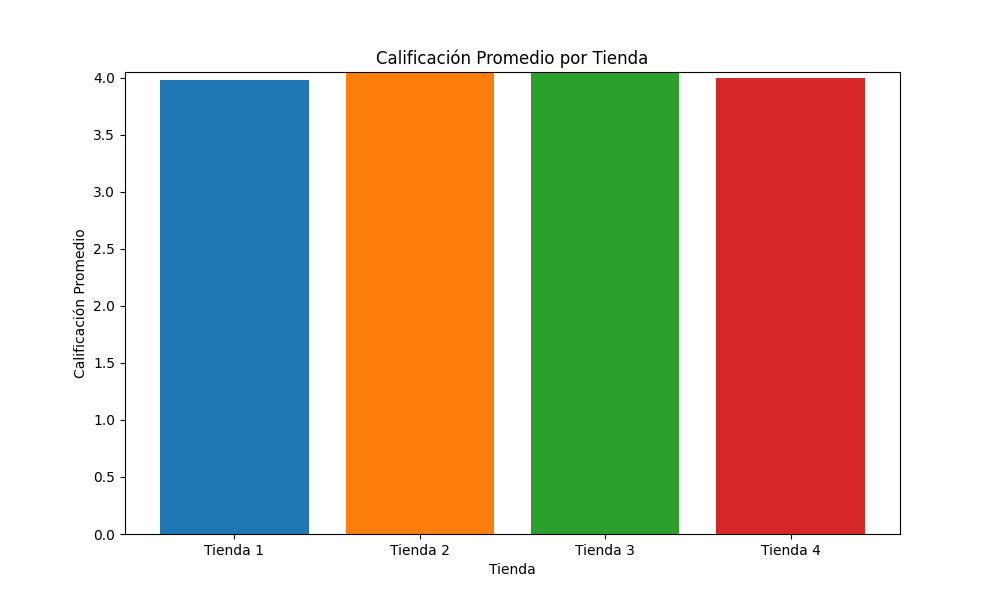

**Resultados**:

- **Tienda 1**: 3.98 (la más baja).
- **Tienda 2**: 4.04.
- **Tienda 3**: 4.05 (la más alta).
- **Tienda 4**: 4.00.

**Observaciones**: La Tienda 3 lidera en satisfacción del cliente, posiblemente por costos de envío competitivos ($24,805.68) y una oferta popular (Muebles). La Tienda 1 podría estar afectada por costos de envío altos ($26,018.61).

## 4. Análisis de Costos de Envío

El siguiente gráfico de barras muestra los costos de envío promedio por tienda:

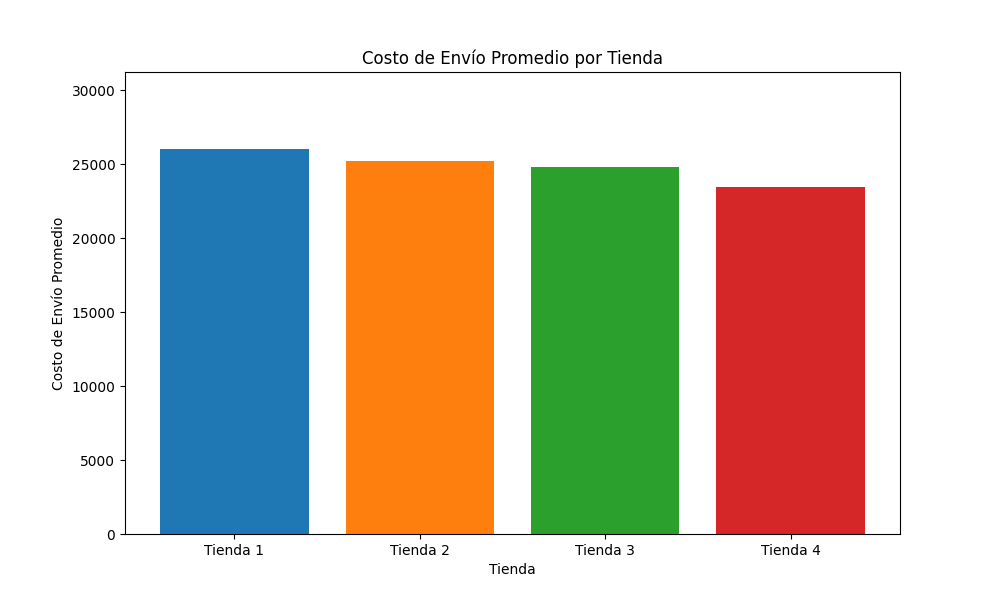

**Resultados**:

- **Tienda 1**: $26,018.61 (el más alto).
- **Tienda 2**: $25,216.24.
- **Tienda 3**: $24,805.68.
- **Tienda 4**: $23,459.46 (el más bajo).

**Observaciones**: La Tienda 4 ofrece los costos de envío más bajos, pero esto no se traduce en mayores ingresos o calificaciones. La Tienda 1 podría mejorar su calificación reduciendo los costos de envío.

## 5. Ventas por Categoría

El siguiente gráfico de líneas compara las ventas por categoría de producto entre las tiendas:

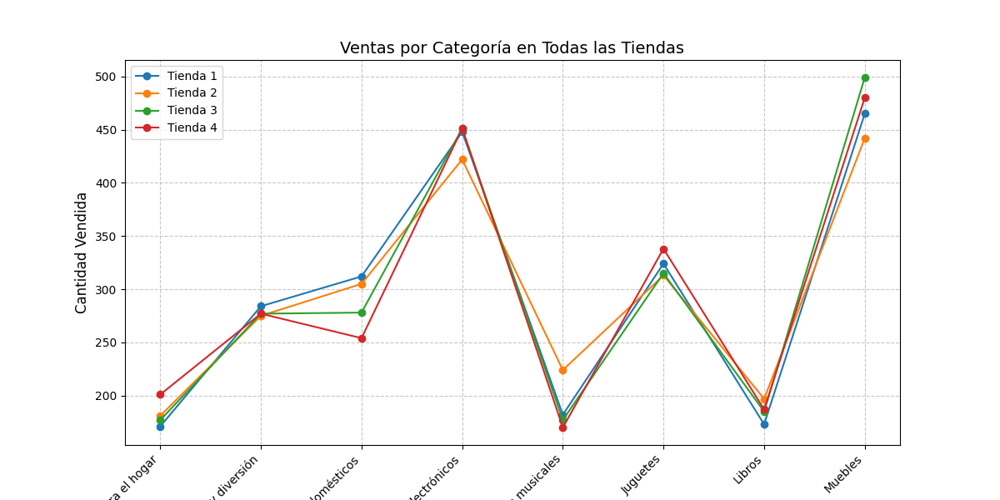

**Resultados**:

- **Categorías principales**: Muebles y Electrónicos son las más vendidas.
- **Tienda 3**: Destaca en Muebles (499 ventas).
- **Tienda 1**: Lidera en Electrónicos (448 ventas).
- **Tienda 2**: Fuerte en Libros (*Iniciando en programación*, 65 ventas).
- **Tienda 4**: Competitiva en Muebles (480 ventas).

**Observaciones**: La fortaleza de la Tienda 3 en Muebles y de la Tienda 1 en Electrónicos explica sus ingresos altos. La Tienda 4, aunque sólida en Muebles, tiene menor diversificación.

Los siguientes gráficos muestran las ventas por producto para cada tienda:

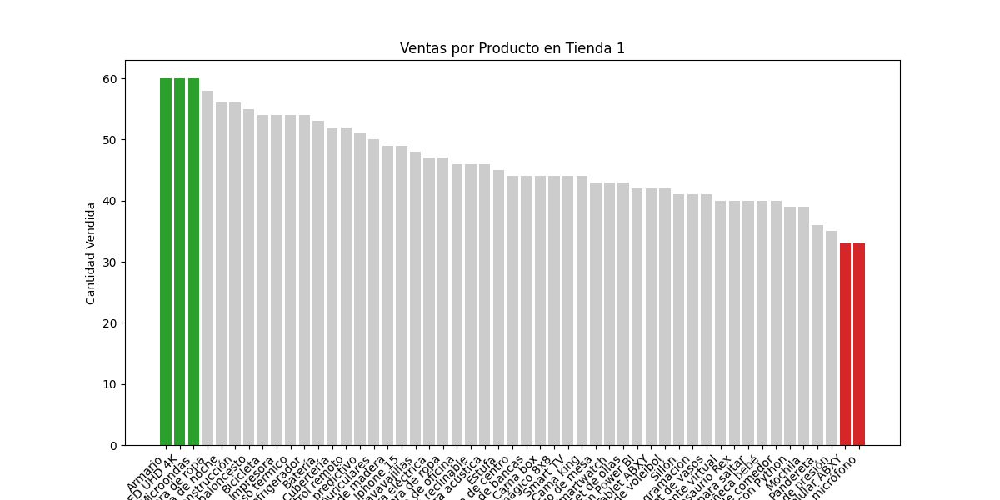

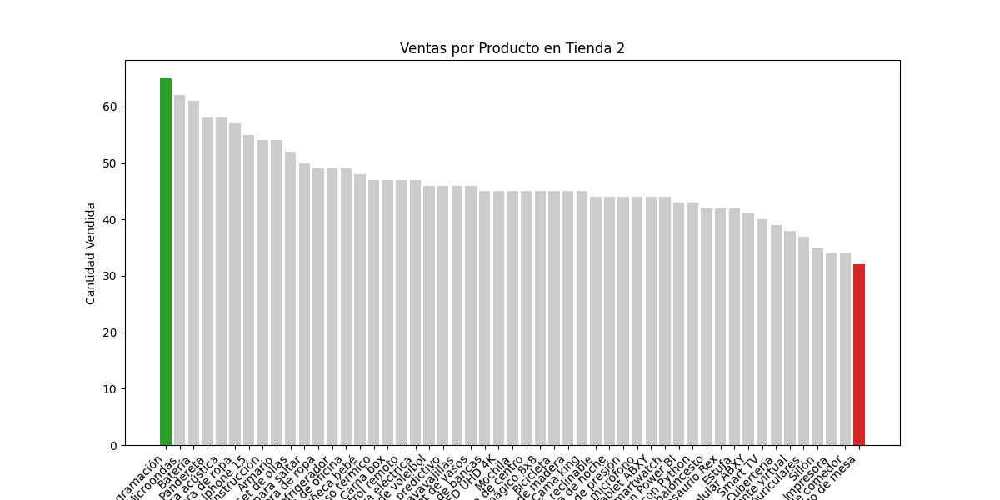

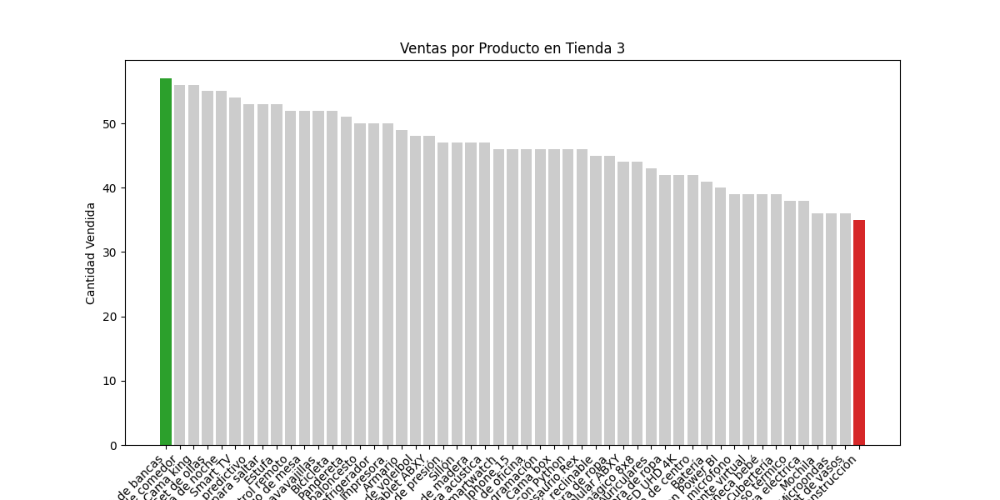

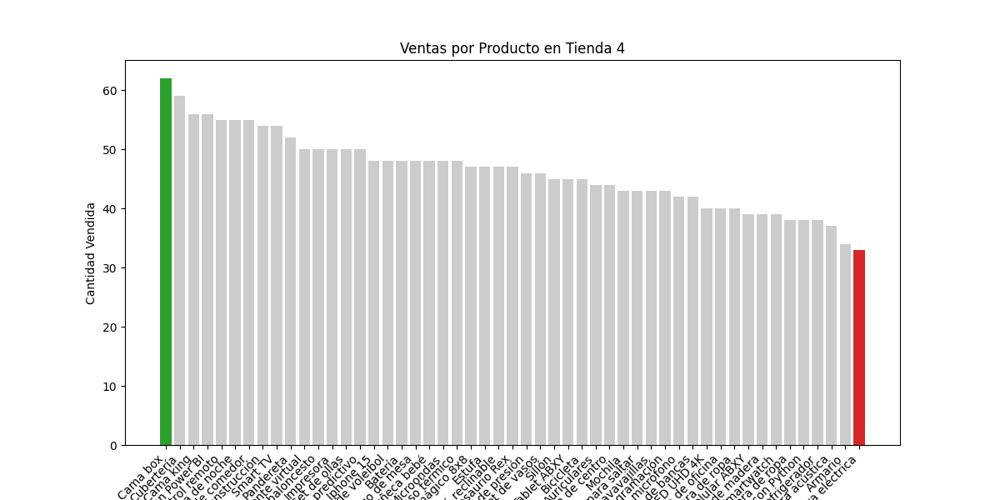

**Resultados**:

- **Tienda 1**: Productos más vendidos: Armario, TV LED UHD 4K, Microondas (60 ventas cada uno).
- **Tienda 2**: Producto más vendido: *Iniciando en programación* (65 ventas).
- **Tienda 3**: Producto más vendido: Kit de bancas (57 ventas).
- **Tienda 4**: Producto más vendido: Cama box (62 ventas).


### 6.1. Distribución de Ventas por Cuadrante

El análisis geográfico divide las ventas en cuatro cuadrantes, comparando el rendimiento real con un esperado de 25% por tienda:

- **Cuadrante Noroeste** (\~85% de las ventas):

  - Tienda 1: 1959 ventas (20.8%), esperado: 25.0%.
  - Tienda 2: 2011 ventas (21.3%), esperado: 25.0%.
  - Tienda 3: 1996 ventas (21.2%), esperado: 25.0%.
  - Tienda 4: 1986 ventas (21.0%), esperado: 25.0%.
  - **Análisis**: Todas las tiendas tienen un rendimiento inferior al esperado. La Tienda 2 lidera (21.3%), mientras que la Tienda 1, pese a sus altos ingresos, tiene el menor porcentaje (20.8%), sugiriendo productos de alto valor.

- **Cuadrante Noreste** (\~2%):

  - Tienda 1: 56 ventas (0.6%), esperado: 25.0%.
  - Tienda 2: 61 ventas (0.6%), esperado: 25.0%.
  - Tienda 3: 48 ventas (0.5%), esperado: 25.0%.
  - Tienda 4: 35 ventas (0.4%), esperado: 25.0%.
  - **Análisis**: Desempeño extremadamente bajo. La Tienda 4 es la más débil (0.4%), contribuyendo a sus menores ingresos.

- **Cuadrante Suroeste** (\~12%):

  - Tienda 1: 312 ventas (3.3%), esperado: 25.0%.
  - Tienda 2: 253 ventas (2.7%), esperado: 25.0%.
  - Tienda 3: 274 ventas (2.9%), esperado: 25.0%.
  - Tienda 4: 302 ventas (3.2%), esperado: 25.0%.
  - **Análisis**: La Tienda 1 lidera (3.3%). La Tienda 2 tiene el menor desempeño (2.7%), indicando una posible debilidad logística.

- **Cuadrante Sureste** (\~1%):

  - Tienda 1: 32 ventas (0.3%), esperado: 25.0%.
  - Tienda 2: 34 ventas (0.4%), esperado: 25.0%.
  - Tienda 3: 41 ventas (0.4%), esperado: 25.0%.
  - Tienda 4: 35 ventas (0.4%), esperado: 25.0%.
  - **Análisis**: Desempeño prácticamente nulo. La Tienda 3 lidera ligeramente (0.4%).

### 6.1. Influencia de las Variables Geográficas

- **Concentración en Noroeste**: Domina las ventas (\~85%), sugiriendo alta densidad poblacional, mayor poder adquisitivo o mejor logística. La Tienda 1 compensa su menor volumen (20.8%) con productos de alto valor.
- **Debilidad en Noreste y Sureste**: Baja actividad (\~3% combinado) indica cobertura logística limitada, baja demanda o competencia local. La Tienda 4 es débil en Noreste (0.4%), afectando sus ingresos.
- **Suroeste**: La Tienda 1 (3.3%) y Tienda 4 (3.2%) muestran un desempeño competitivo, sugiriendo una ventaja logística.
- **Ingresos**: La Tienda 1 lidera pese a un menor volumen en Noroeste, indicando precios más altos. La Tienda 4 tiene ingresos más bajos, probablemente por productos de menor valor.
- **Calificaciones**: Las Tiendas 2 (4.04) y 3 (4.05) tienen calificaciones altas, probablemente por costos de envío competitivos y buena experiencia en Noroeste. La Tienda 1 (3.98) podría estar afectada por costos de envío altos.

### 6.2. Patrones Geográficos

- **Dominio de Noroeste**: Sugiere centros de distribución cercanos o una base de clientes fuerte.
- **Oportunidades en Noreste y Sureste**: La baja actividad indica potencial para expandir la cobertura logística o adaptar productos.
- **Ventaja en Suroeste**: La Tienda 1 y Tienda 4 podrían capitalizar su presencia para aumentar ventas.

## 7. Conclusiones y Recomendaciones

- **Tienda 4**: Menor ingreso ($1,038,375,700.00), baja presencia en Noreste (0.4%), y calificación promedio (4.00) apoyan su venta. Explorar ventas en Suroeste (3.2%) podría ser una alternativa antes de vender.
- **Tienda 1**: Lidera en ingresos ($1,150,880,400.00), pero su calificación baja (3.98) y costos de envío altos ($26,018.61) sugieren optimizar la logística.
- **Tiendas 2 y 3**: Desempeño equilibrado en Noroeste (21.3% y 21.2%), calificaciones altas (4.04 y 4.05), y costos de envío competitivos. Expandirse en Suroeste (especialmente Tienda 2, 2.7%) podría aumentar ingresos.
- **Expansión geográfica**: Aumentar ventas en Noreste y Sureste mediante centros de distribución, campañas de marketing o productos adaptados.
- **Optimización logística**: Reducir costos de envío de la Tienda 1 para mejorar calificaciones.

Con base a este análisis se destaca la importancia de la distribución geográfica y respalda la venta de la Tienda 4.